In [55]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns 
%matplotlib inline
import plotly.express as px
import plotly.graph_objects as go
from collections import Counter

In [56]:
dataset=pd.read_csv('globalterrorismdb_0718dist.csv',encoding='ISO-8859-1',low_memory=False)
dataset.head(10)

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
5,197001010002,1970,1,1,NaN,0,NaN,217,United States,1,...,"The Cairo Chief of Police, William Petersen, r...","""Police Chief Quits,"" Washington Post, January...","""Cairo Police Chief Quits; Decries Local 'Mili...","Christopher Hewitt, ""Political Violence and Te...",Hewitt Project,-9,-9,0,-9,NaN
6,197001020001,1970,1,2,NaN,0,NaN,218,Uruguay,3,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
7,197001020002,1970,1,2,NaN,0,NaN,217,United States,1,...,"Damages were estimated to be between $20,000-$...",Committee on Government Operations United Stat...,"Christopher Hewitt, ""Political Violence and Te...",NaN,Hewitt Project,-9,-9,0,-9,NaN
8,197001020003,1970,1,2,NaN,0,NaN,217,United States,1,...,The New Years Gang issue a communiqué to a loc...,"Tom Bates, ""Rads: The 1970 Bombing of the Army...","David Newman, Sandra Sutherland, and Jon Stewa...","The Wisconsin Cartographers' Guild, ""Wisconsin...",Hewitt Project,0,0,0,0,NaN
9,197001030001,1970,1,3,NaN,0,NaN,217,United States,1,...,"Karl Armstrong's girlfriend, Lynn Schultz, dro...",Committee on Government Operations United Stat...,"Tom Bates, ""Rads: The 1970 Bombing of the Army...","David Newman, Sandra Sutherland, and Jon Stewa...",Hewitt Project,0,0,0,0,NaN


In [57]:
dataset.sample(10)

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
100413,201102230008,2011,2,23,NaN,0,NaN,92,India,6,...,NaN,"South Asia Terrorism Portal, ""Maoists Blow up ...","Janes Intelligence, Suspected CPI-M Militant...","Hindu, Maoists Blast Panchayat Office, Hindu...",ISVG,0,0,0,0,NaN
97222,201007070025,2010,7,7,NaN,0,NaN,153,Pakistan,6,...,NaN,"Daily Times, Terrorists Target Boys College ...","Xiong Tong, Car Showroom Blasted in Peshawar,...","South Asia Terrorism Portal, Bomb Blast Destr...",ISVG,-9,-9,0,-9,NaN
20925,198402070002,1984,2,7,NaN,0,NaN,69,France,8,...,NaN,NaN,NaN,NaN,PGIS,1,1,1,1,NaN
18748,198305160002,1983,5,16,NaN,0,NaN,45,Colombia,3,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
48289,199109260056,1991,9,26,NaN,0,NaN,159,Peru,3,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,"199109260056, 199109260022, 199109260023, 1991..."
24348,198502060012,1985,2,6,NaN,0,NaN,61,El Salvador,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
138328,201409270016,2014,9,27,2014-09-27 00:00:00,0,NaN,228,Yemen,10,...,NaN,"""Yemen: Open Source Security Highlights 28 Sep...",NaN,NaN,START Primary Collection,-9,-9,0,-9,NaN
127715,201402220033,2014,2,22,NaN,0,NaN,4,Afghanistan,6,...,NaN,"""State PAO: Afghan Evening News Clips 23 Febru...","""Gunmen kill two policemen in northern Afgha...",NaN,START Primary Collection,0,0,0,0,NaN
43278,199007140005,1990,7,14,NaN,0,NaN,183,South Africa,11,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
139175,201410150037,2014,10,15,NaN,0,NaN,153,Pakistan,6,...,Casualty numbers for this incident conflict ac...,"""Bomber kills 7 in attack on pro-govt mi...","""Pakistan: Suicide attack on Amn Lashkar in Kh...","""Highlights: Pakistan Media 16 October 2014,"" ...",START Primary Collection,0,0,0,0,NaN


In [58]:
dataset.shape

(181691, 135)

In [59]:
dataset.columns

Index(['eventid', 'iyear', 'imonth', 'iday', 'approxdate', 'extended',
       'resolution', 'country', 'country_txt', 'region',
       ...
       'addnotes', 'scite1', 'scite2', 'scite3', 'dbsource', 'INT_LOG',
       'INT_IDEO', 'INT_MISC', 'INT_ANY', 'related'],
      dtype='object', length=135)

In [60]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Columns: 135 entries, eventid to related
dtypes: float64(55), int64(22), object(58)
memory usage: 187.1+ MB


In [61]:
dataset.describe()

,eventid,iyear,imonth,iday,extended,country,region,latitude,longitude,specificity,...,ransomamt,ransomamtus,ransompaid,ransompaidus,hostkidoutcome,nreleased,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
count,1.816910e+05,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,177135.000000,1.771340e+05,181685.000000,...,1.350000e+03,5.630000e+02,7.740000e+02,552.000000,10991.000000,10400.000000,181691.000000,181691.000000,181691.000000,181691.000000
mean,2.002705e+11,2002.638997,6.467277,15.505644,0.045346,131.968501,7.160938,23.498343,-4.586957e+02,1.451452,...,3.172530e+06,5.784865e+05,7.179437e+05,240.378623,4.629242,-29.018269,-4.543731,-4.464398,0.090010,-3.945952
std,1.325957e+09,13.259430,3.388303,8.814045,0.208063,112.414535,2.933408,18.569242,2.047790e+05,0.995430,...,3.021157e+07,7.077924e+06,1.014392e+07,2940.967293,2.035360,65.720119,4.543547,4.637152,0.568457,4.691325
min,1.970000e+11,1970.000000,0.000000,0.000000,0.000000,4.000000,1.000000,-53.154613,-8.618590e+07,1.000000,...,-9.900000e+01,-9.900000e+01,-9.900000e+01,-99.000000,1.000000,-99.000000,-9.000000,-9.000000,-9.000000,-9.000000
25%,1.991021e+11,1991.000000,4.000000,8.000000,0.000000,78.000000,5.000000,11.510046,4.545640e+00,1.000000,...,0.000000e+00,0.000000e+00,-9.900000e+01,0.000000,2.000000,-99.000000,-9.000000,-9.000000,0.000000,-9.000000
50%,2.009022e+11,2009.000000,6.000000,15.000000,0.000000,98.000000,6.000000,31.467463,4.324651e+01,1.000000,...,1.500000e+04,0.000000e+00,0.000000e+00,0.000000,4.000000,0.000000,-9.000000,-9.000000,0.000000,0.000000
75%,2.014081e+11,2014.000000,9.000000,23.000000,0.000000,160.000000,10.000000,34.685087,6.871033e+01,1.000000,...,4.000000e+05,0.000000e+00,1.273412e+03,0.000000,7.000000,1.000000,0.000000,0.000000,0.000000,0.000000
max,2.017123e+11,2017.000000,12.000000,31.000000,1.000000,1004.000000,12.000000,74.633553,1.793667e+02,5.000000,...,1.000000e+09,1.320000e+08,2.750000e+08,48000.000000,7.000000,2769.000000,1.000000,1.000000,1.000000,1.000000


In [62]:
dataset.isnull().sum()

eventid            0
iyear              0
imonth             0
iday               0
approxdate    172452
               ...  
INT_LOG            0
INT_IDEO           0
INT_MISC           0
INT_ANY            0
related       156653
Length: 135, dtype: int64

In [63]:
dataset.rename(columns={'iyear':'Year','imonth':'Month','city':'City','iday':'Day','country_txt':'Country','region_txt':'Region','attacktype1_txt':'AttackType','target1':'Target','nkill':'Killed','nwound':'Wounded','summary':'Summary','gname':'Group','targtype1_txt':'Target_type','weaptype1_txt':'Weapon_type','motive':'Motive'},inplace=True)
dataset['Casualities'] = dataset.Killed + dataset.Wounded
dataset=dataset[['Year','Month','Day','Country','Region','City','latitude','longitude','AttackType','Killed','Wounded','Casualities','Target','Group','Target_type','Weapon_type']]
dataset.head(10)

,Year,Month,Day,Country,Region,City,latitude,longitude,AttackType,Killed,Wounded,Casualities,Target,Group,Target_type,Weapon_type
0,1970,7,2,Dominican Republic,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,1.0,Julio Guzman,MANO-D,Private Citizens & Property,Unknown
1,1970,0,0,Mexico,North America,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,0.0,"Nadine Chaval, daughter",23rd of September Communist League,Government (Diplomatic),Unknown
2,1970,1,0,Philippines,Southeast Asia,Unknown,15.478598,120.599741,Assassination,1.0,0.0,1.0,Employee,Unknown,Journalists & Media,Unknown
3,1970,1,0,Greece,Western Europe,Athens,37.997490,23.762728,Bombing/Explosion,NaN,NaN,NaN,U.S. Embassy,Unknown,Government (Diplomatic),Explosives
4,1970,1,0,Japan,East Asia,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,NaN,NaN,NaN,U.S. Consulate,Unknown,Government (Diplomatic),Incendiary
5,1970,1,1,United States,North America,Cairo,37.005105,-89.176269,Armed Assault,0.0,0.0,0.0,Cairo Police Headquarters,Black Nationalists,Police,Firearms
6,1970,1,2,Uruguay,South America,Montevideo,-34.891151,-56.187214,Assassination,0.0,0.0,0.0,Juan Maria de Lucah/Chief of Directorate of in...,Tupamaros (Uruguay),Police,Firearms
7,1970,1,2,United States,North America,Oakland,37.791927,-122.225906,Bombing/Explosion,0.0,0.0,0.0,Edes Substation,Unknown,Utilities,Explosives
8,1970,1,2,United States,North America,Madison,43.076592,-89.412488,Facility/Infrastructure Attack,0.0,0.0,0.0,"R.O.T.C. offices at University of Wisconsin, M...",New Year's Gang,Military,Incendiary
9,1970,1,3,United States,North America,Madison,43.072950,-89.386694,Facility/Infrastructure Attack,0.0,0.0,0.0,Selective Service Headquarters in Madison Wisc...,New Year's Gang,Government (General),Incendiary


In [64]:
dataset.sample(10)

,Year,Month,Day,Country,Region,City,latitude,longitude,AttackType,Killed,Wounded,Casualities,Target,Group,Target_type,Weapon_type
155824,2015,11,23,Afghanistan,South Asia,Kabul,34.516895,69.147011,Bombing/Explosion,0.0,0.0,0.0,Unknown,Taliban,Unknown,Explosives
96845,2010,6,9,India,South Asia,Panchapur,24.889099,84.860015,Facility/Infrastructure Attack,0.0,0.0,0.0,A construction company,Communist Party of India - Maoist (CPI-Maoist),Business,Incendiary
29585,1986,11,17,Iran,Middle East & North Africa,Tehran,35.724533,51.405190,Unknown,5.0,7.0,12.0,District of Saggez,Muslims,Private Citizens & Property,Unknown
167517,2016,9,27,Iraq,Middle East & North Africa,Radwaniyah,33.192356,44.001503,Bombing/Explosion,2.0,0.0,2.0,Cattle Herders,Unknown,Private Citizens & Property,Explosives
99541,2010,12,18,Afghanistan,South Asia,Kandahar,31.631083,65.742226,Assassination,2.0,6.0,8.0,"Hamdullah Nazik, the governor of Daman district,",Unknown,Government (General),Explosives
68403,1998,11,29,Turkey,Middle East & North Africa,Unknown,NaN,NaN,Armed Assault,16.0,1.0,17.0,Turkish Military Helicopter in Turkey,Kurdistan Workers' Party (PKK),Military,Firearms
163660,2016,6,14,Sudan,Sub-Saharan Africa,El Geneina,13.440886,22.441727,Armed Assault,0.0,2.0,2.0,Farmers,Unknown,Private Citizens & Property,Firearms
149469,2015,6,17,Iraq,Middle East & North Africa,Baghdad,33.303566,44.371773,Bombing/Explosion,2.0,6.0,8.0,Civilians,Unknown,Private Citizens & Property,Explosives
557,1970,10,15,Uruguay,South America,Montevideo,-34.891151,-56.187214,Facility/Infrastructure Attack,0.0,0.0,0.0,General Electric Offices,Tupamaros (Uruguay),Business,Incendiary
67182,1997,11,22,Spain,Western Europe,Durango,43.169068,-2.632655,Facility/Infrastructure Attack,0.0,0.0,0.0,Savings Bank,Unknown,Business,Incendiary


In [65]:
dataset.dropna(axis=0, inplace=True)
dataset.shape

(159946, 16)

In [66]:
dataset.isnull().sum()


Year           0
Month          0
Day            0
Country        0
Region         0
City           0
latitude       0
longitude      0
AttackType     0
Killed         0
Wounded        0
Casualities    0
Target         0
Group          0
Target_type    0
Weapon_type    0
dtype: int64

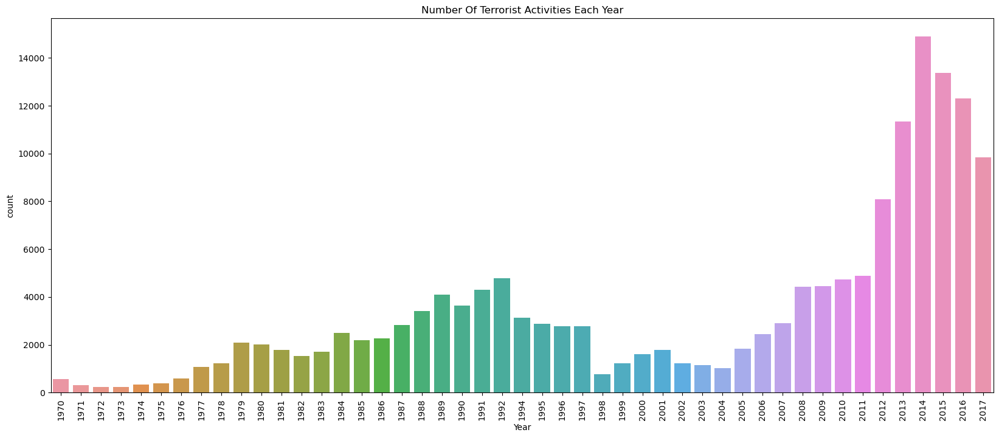

In [67]:
plt.figure(figsize=(20,8))
sns.countplot(x="Year", data=dataset)
plt.xticks(rotation=90)
plt.title('Number Of Terrorist Activities Each Year')
plt.show()

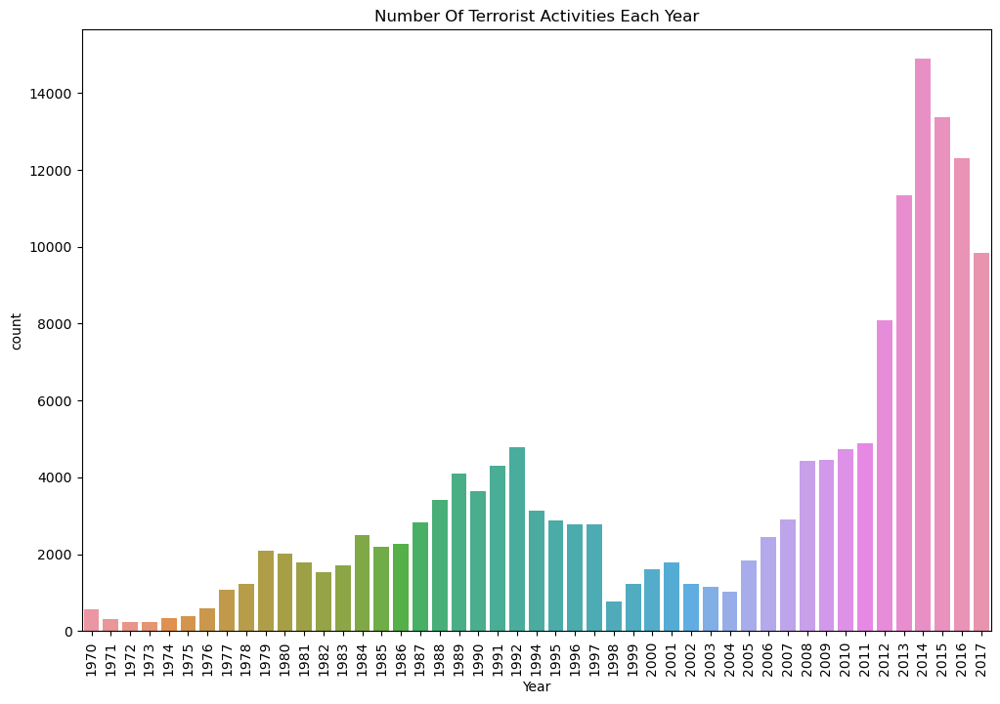

In [68]:
plt.figure(figsize=(12,8))
sns.countplot(x="Year", data=dataset)
plt.xticks(rotation=90)
plt.title('Number Of Terrorist Activities Each Year')
plt.show()

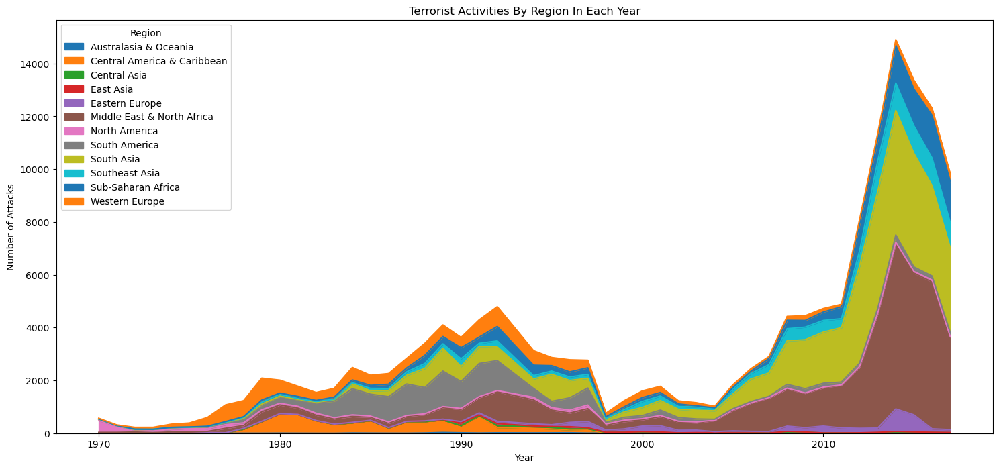

In [69]:
pd.crosstab(dataset.Year, dataset.Region).plot(kind='area',figsize=(18,8))
plt.title('Terrorist Activities By Region In Each Year')
plt.ylabel('Number of Attacks')
plt.show()

In [70]:
terror1 = dataset.sort_values(by='Casualities',ascending=False)[:40]

In [71]:
heat=terror1.pivot_table(index='Country',columns='Year',values='Casualities')
heat.fillna(0,inplace=True)

In [72]:
heat.head(10)

Year,1982,1984,1987,1992,1994,1995,1996,1997,1998,2001,2004,2005,2006,2007,2008,2009,2014,2015,2016,2017
Country,,,,,,,,,,,,,,,,,,,,
Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,536.0,0.000000,584.0
Chad,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1161.0,0.0,0.0,0.0,0.000000,0.0
Ethiopia,0.0,0.0,0.0,500.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0
France,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,520.000000,0.0
India,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1005.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0
Iran,760.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0
Iraq,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,702.0,462.0,833.333333,0.0,654.0,670.0,0.0,911.666667,0.0
Japan,0.0,0.0,0.0,0.0,507.0,3092.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0
Kenya,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4224.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0


In [73]:
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
colorscale = [[0, '#edf8fb'], [.3, '#A52A2A'],  [.6,'#76EE00'],  [1, '#008B8B']]
heatmap = go.Heatmap(z=heat.values, x=heat.columns, y=heat.index, colorscale=colorscale)
data = [heatmap]
layout = go.Layout(
    title='Top 40 Worst Terror Attacks in History from 1982 to 2016',
    xaxis = dict(ticks='', nticks=20),
    yaxis = dict(ticks='')
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='heatmap',show_link=False)

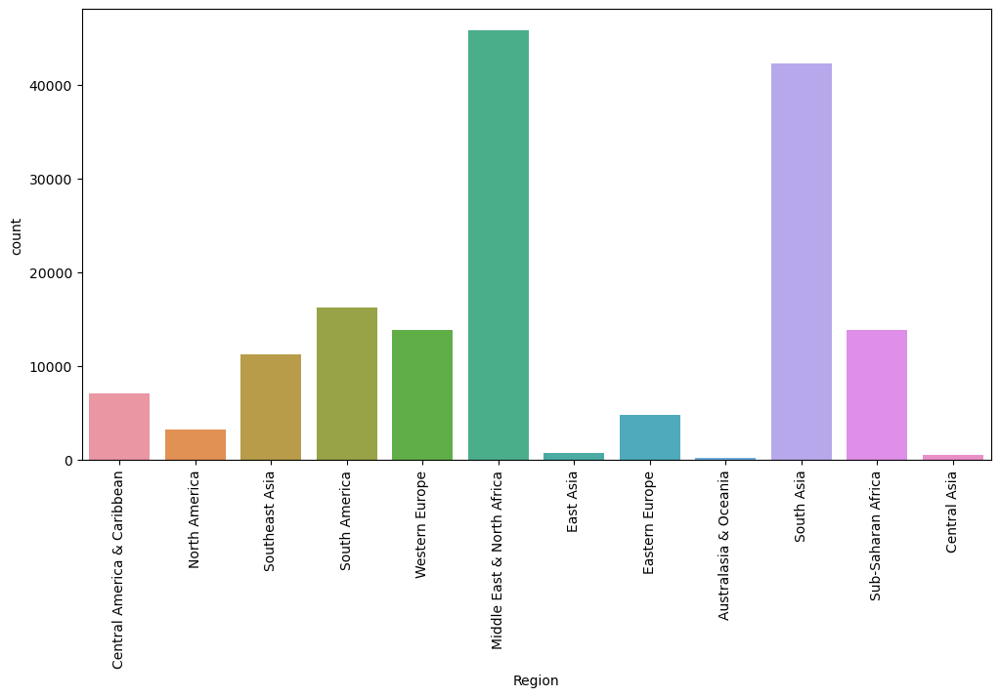

In [78]:
dataset['Region'].value_counts()
plt.figure(figsize=(12,6
                   ))
sns.countplot(x='Region',data=dataset)
plt.xticks(rotation=90)
plt.show()

In [79]:
year_cas = dataset.groupby('Year').Casualities.sum().to_frame().reset_index()
year_cas.columns = ['Year',""'Casualities']
px.bar(data_frame=year_cas,x = 'Year',y = 'Casualities',color='Casualities',template='plotly_dark')

In [81]:
target = list(dataset['Target_type'])
target_map = dict(Counter(target))
target_df = pd.DataFrame(target_map.items())
target_df.columns = ['Target Type','Count']
px.bar(data_frame=target_df,x = 'Target Type',y = 'Count',color='Target Type',template='plotly_white')

In [82]:
AttackType=dataset.pivot_table(columns='AttackType',values='Casualities',aggfunc='sum')
AttackType = AttackType.T
AttackType['Type'] = AttackType.index

In [85]:
labels = AttackType.columns.tolist()
attack=AttackType.T
values=attack.values.tolist()
values = sum(values,[])
attack_type = list(dataset['AttackType'].unique())
fig = go.Figure(data=[go.Pie(labels = attack_type,values=values,hole=.3)])
fig.update_layout(template = 'gridon')
fig.show()

Text(0.5, 1.0, 'Favorite Targets')

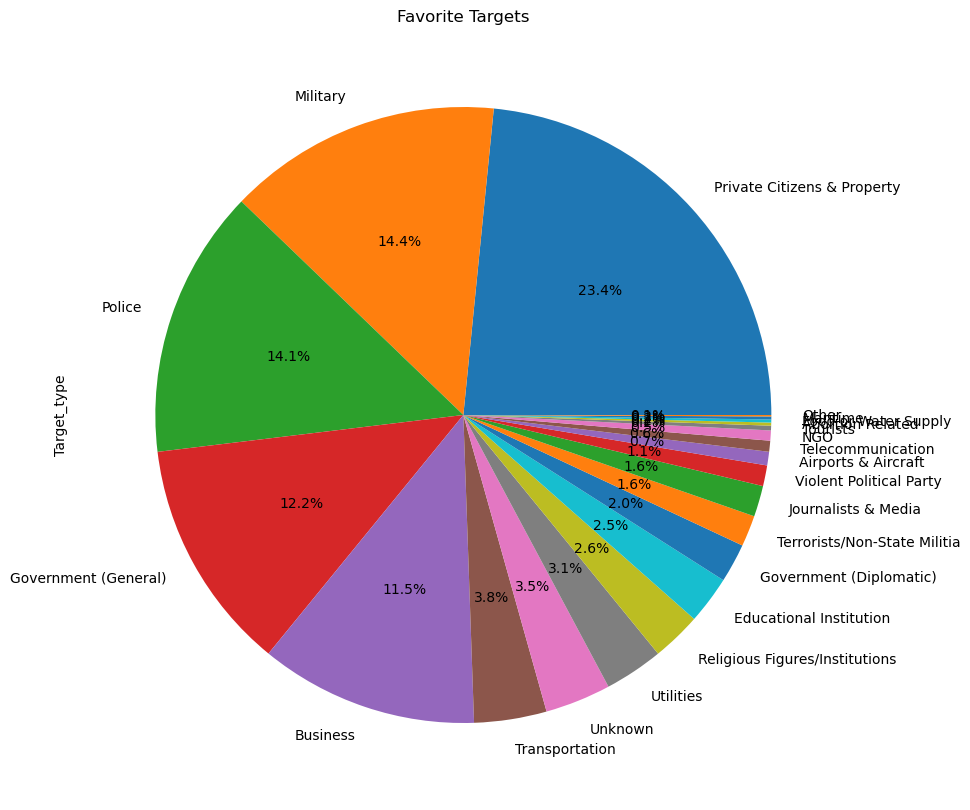

In [86]:
dataset['Target_type'].value_counts().plot(kind='pie',figsize=[12,10],autopct='%1.1f%%')
plt.title('Favorite Targets')

In [87]:
from collections import Counter
values = list(dataset['AttackType'])
value_map = dict(Counter(values))
value_dataset = pd.DataFrame(value_map.items())
value_dataset.columns = ["AttackType","Count of Attack Type"]
px.bar(data_frame=value_dataset,x = 'AttackType',y = 'Count of Attack Type',color = 'AttackType',template="plotly_white")

<AxesSubplot:ylabel='Weapon_type'>

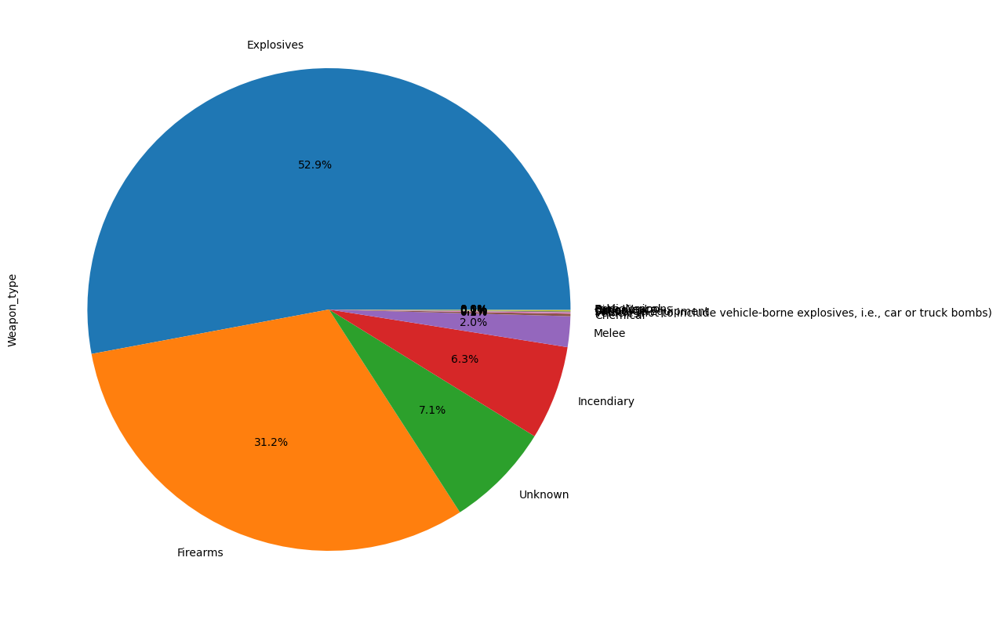

In [88]:
dataset['Weapon_type'].value_counts().plot(kind='pie',figsize=[15,10],autopct='%1.1f%%')


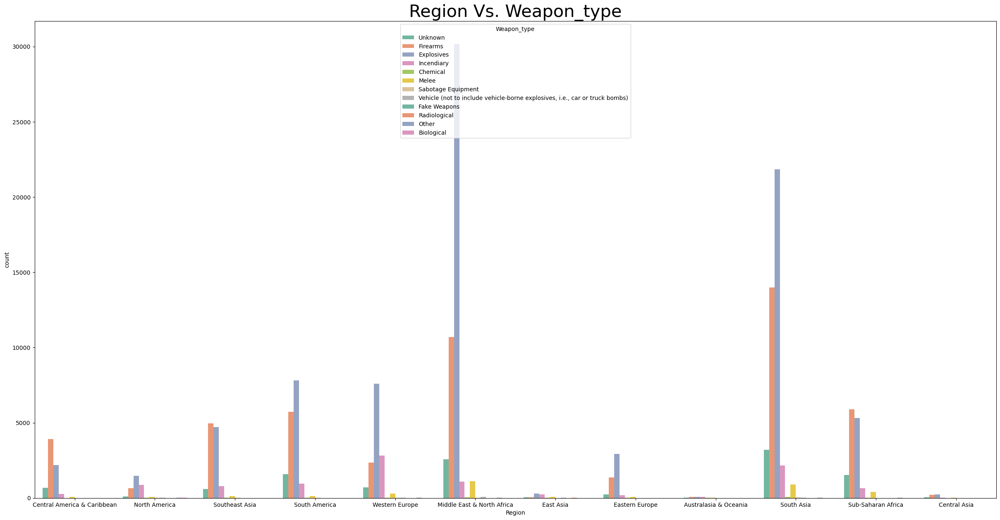

In [89]:
plt.subplots(figsize = (30,15))
sns.countplot(x="Region", hue ='Weapon_type', data = dataset,palette = "Set2")
plt.title('Region Vs. Weapon_type', fontsize = 30)
plt.show()

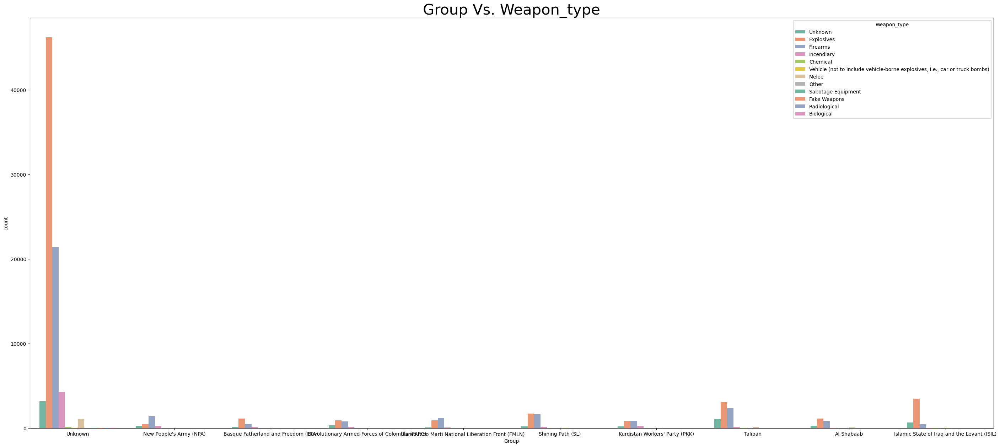

In [90]:
plt.subplots(figsize = (35,15))
Top_10_Group = dataset['Group'].value_counts().index.tolist()[0:10]
snap = dataset[['Group','Weapon_type']]
AttackG_Weapon = snap[snap['Group'].isin(Top_10_Group)]
sns.countplot(x='Group', hue ='Weapon_type', data = AttackG_Weapon,palette = "Set2")
plt.title('Group Vs. Weapon_type', fontsize = 30)
plt.show()

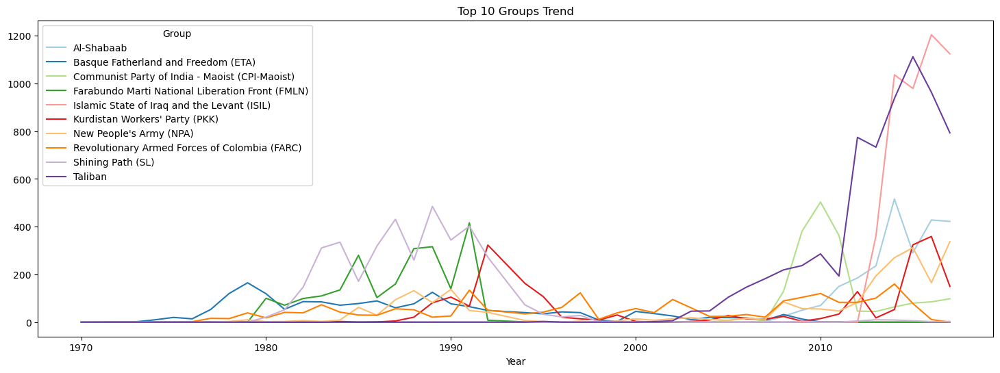

In [91]:
top_groups10=dataset[dataset['Group'].isin(dataset['Group'].value_counts()[1:11].index)]
pd.crosstab(top_groups10.Year,top_groups10.Group).plot(color=sns.color_palette('Paired',15))
fig=plt.gcf()
fig.set_size_inches(18,6)
plt.title("Top 10 Groups Trend")
plt.show()

In [92]:
import folium
from folium.plugins import MarkerCluster
year=dataset[dataset['Year']==2014]
mapData=year.loc[:,'City':'longitude']
mapData=mapData.dropna().values.tolist()

map = folium.Map(location = [0, 50], tiles='CartoDB positron', zoom_start=2) 
markerCluster = folium.plugins.MarkerCluster().add_to(map)
for point in range(0, len(mapData)):
    folium.Marker(location=[mapData[point][1],mapData[point][2]],
                  popup = mapData[point][0]).add_to(markerCluster)
map

In [93]:
dataset.Country.value_counts()[:15]

Iraq              23122
Pakistan          13798
Afghanistan       11716
India             11293
Colombia           7262
Philippines        6220
Peru               5091
Turkey             3964
Thailand           3528
El Salvador        3499
United Kingdom     3486
Somalia            3095
Spain              2870
Yemen              2860
Nigeria            2852
Name: Country, dtype: int64

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



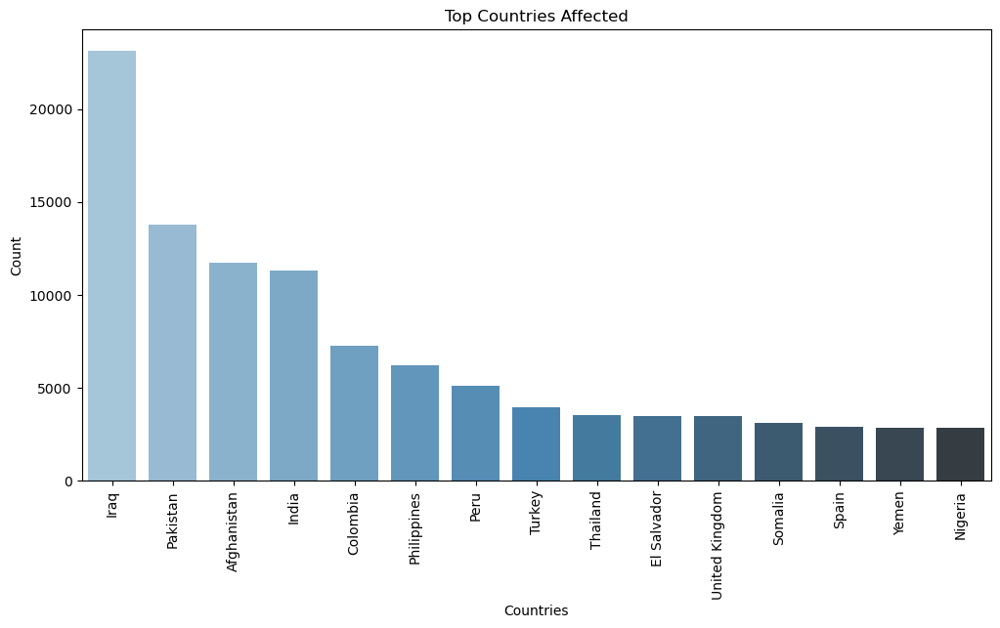

In [39]:
plt.subplots(figsize=(12,6))
sns.barplot(dataset['Country'].value_counts()[:15].index,dataset['Country'].value_counts()[:15].values,palette='Blues_d')
plt.title('Top Countries Affected')
plt.xlabel('Countries')
plt.ylabel('Count')
plt.xticks(rotation= 90)
plt.show()

In [94]:
plt.figure(figsize=(12,6))
country_attack=dataset.Country.value_counts()[:15].reset_index()
country_attack.columns= ["Country", "Total Attacks"]
px.bar(data_frame= country_attack,x = 'Country',y = 'Total Attacks',color = 'Country',template='plotly_white')


<Figure size 1200x600 with 0 Axes>

In [95]:
region_attacks = dataset.Region.value_counts().to_frame().reset_index()
region_attacks.columns = ['Region', 'Total Attacks']
fig = px.bar_polar(data_frame=region_attacks,r = 'Total Attacks',theta='Region',color = 'Region',
                  template="ggplot2", color_discrete_sequence= px.colors.sequential.Plasma_r)
fig.show()